## UKBB+HCP GLM & Spatial Autocorrelation Analysis

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from env.imports import *

/ext3/miniconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
2025-03-20 10:25:53.377562: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-20 10:25:54.740776: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-20 10:25:56.403645: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
from models import *
from data import * 
from env import *
from sim import *

In [4]:
# overall imports
import importlib
import data
from sim.sim_utils import bytes2human, print_system_usage

# data load
from data.data_load import load_transcriptome, load_connectome, load_coords
from data.data_viz import plot_connectome, plot_connectome_with_labels, plot_transcriptome
importlib.reload(data.data_load)
importlib.reload(data.data_viz)


<module 'data.data_viz' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/data/data_viz.py'>

In [5]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 4.5%
RAM Usage: 7.6%
Available RAM: 930.7G
Total RAM: 1007.0G
52.4G


In [6]:
GPUtil.getAvailable()

[0]

## Load in connectomes

In [8]:
Y_sc = load_connectome(parcellation='S400', omit_subcortical=False, hemisphere='both', measure='SC')
Y_fc, region_labels, lh_indices, rh_indices = load_connectome(parcellation='S400', omit_subcortical=False, hemisphere='both', measure='FC', include_labels=True)


## Load in transcriptome

Text(0.5, 0, 'Genes')

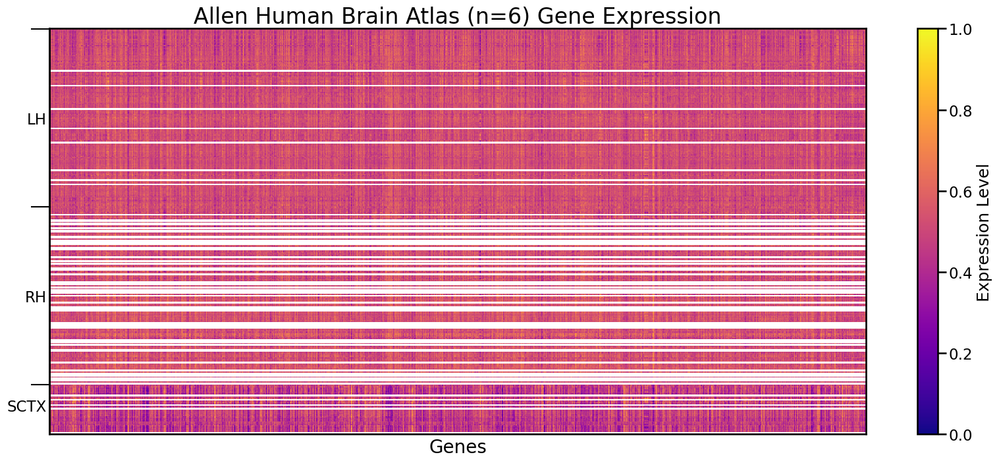

In [18]:
# Alphabetical 
X = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes=None, impute_strategy=None)

# Visualize transcriptome matrix
plt.figure(figsize=(20, 8))
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Allen Human Brain Atlas (n=6) Gene Expression', fontsize=24)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=20)


Text(0.5, 0, 'Genes')

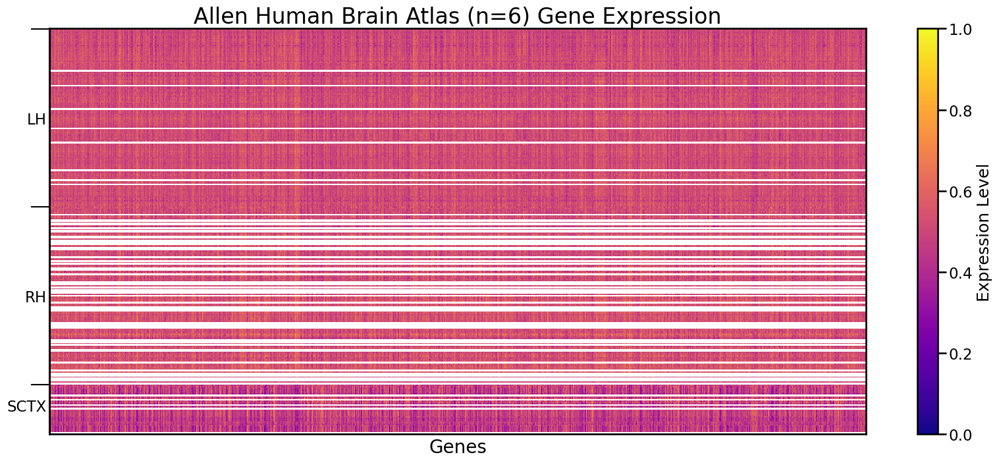

In [19]:
# Random
X = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes='random', impute_strategy=None)

# Visualize transcriptome matrix
plt.figure(figsize=(20, 8))
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Allen Human Brain Atlas (n=6) Gene Expression', fontsize=24)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=20)


Text(0.5, 0, 'Genes')

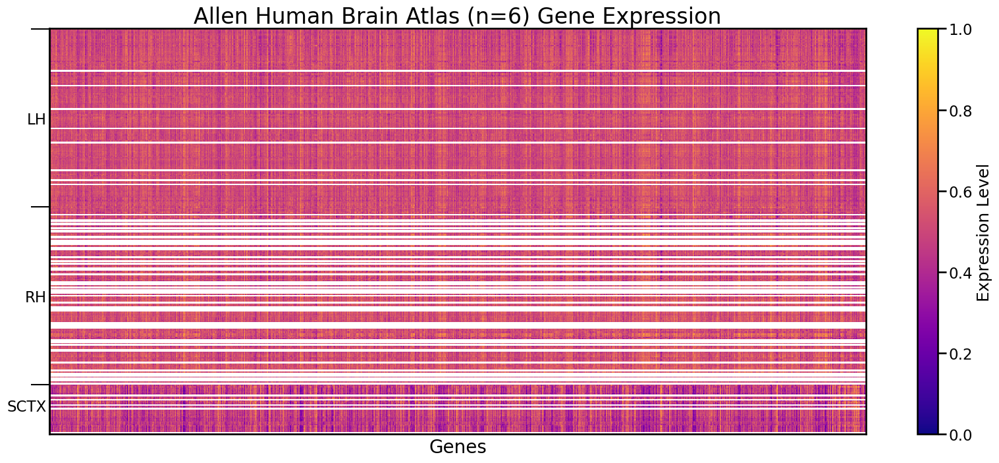

In [20]:
# Sorted by chromosome
X = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', impute_strategy=None, sort_genes='refgenome')

# Visualize transcriptome matrix
plt.figure(figsize=(20, 8))
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Allen Human Brain Atlas (n=6) Gene Expression', fontsize=24)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=20)


valid genes ['CRNDE', 'ECEL1', 'CHRNA3', 'RSPO4', 'TTR', 'RGS8', 'CA12', 'GINS3', 'KLHL13', 'S100PBP', 'PARD3B', 'PDE3A', 'SIX3', 'SCIN', 'NHSL1', 'BTN2A2', 'PIRT', 'RAB2B', 'SMIM30', 'DRD2', 'LONRF3', 'CYB5R3', 'SLITRK6', 'ELP4', 'HEYL', 'PKNOX1', 'GPRIN2', 'LHX8', 'MEGF11', 'C10orf105', 'AUTS2', 'PDIA3', 'PDIA3P1', 'CPNE3', 'TMEM255A', 'TMEM215', 'CYP7B1', 'IL13RA2', 'GPR75', 'TEAD1', 'KCNE5', 'PDLIM5', 'STAT1', 'C6orf118', 'CYLD', 'BAG3', 'TTPA', 'PINLYP', 'PCDH15', 'PREX2', 'PLXDC2', 'RASL12', 'DERL1', 'SCN7A', 'ARHGAP36', 'DNAJC12', 'AKIRIN2', 'ACVR1', 'ENKUR', 'NPL', 'FLVCR1', 'SAMD11', 'DNAH9', 'ADIPOR1', 'COL8A2', 'MAP3K1', 'LOC100233156', 'ADARB2-AS1', 'PFKFB3', 'SDC2', 'DAB2', 'CASC2', 'RGS22', 'PHKA1', 'HEY2', 'CENPVL3', 'PTGER3', 'CCDC85C', 'YBX3', 'PRSS35', 'VANGL1', 'PLXNA3', 'GLUD1', 'SSR1', 'MLF1', 'FAM210B', 'SERPINB1', 'WDR1', 'CFLAR', 'SZRD1', 'DAPL1', 'SPATA18', 'STK33', 'CFAP61', 'MAML2', 'DIRC2', 'ZNF516', 'MINK1', 'FAM111A', 'LINC01485', 'SCN9A', 'LINC00886', 'CX

Text(0.5, 0, 'Genes')

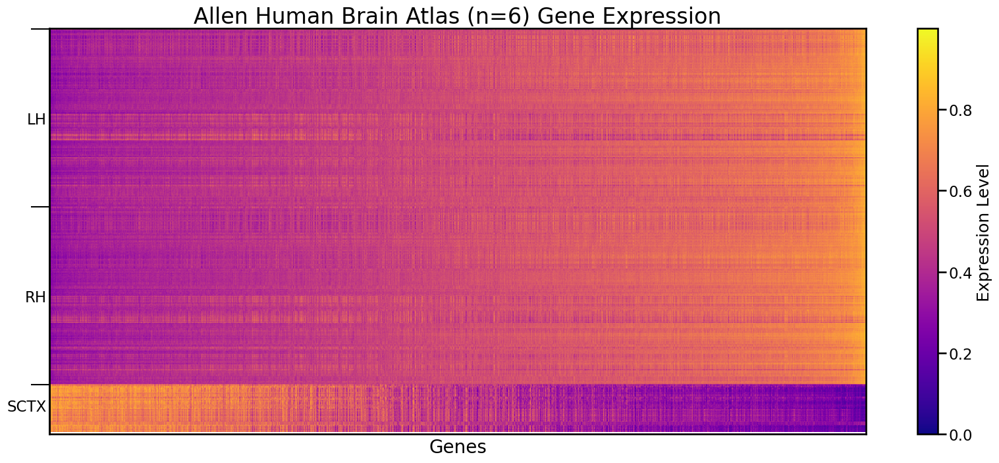

In [23]:
X, valid_genes = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes='expression', impute_strategy='mirror_interpolate', return_valid_genes=True)

'''
# Sort columns by mean expression
mean_expr = np.nanmean(X, axis=0)
sort_idx = np.argsort(mean_expr)
X = X[:, sort_idx]

# Get gene names for lowest and highest expression
lowest_20_genes = [valid_genes[i] for i in sort_idx[:20]]
highest_20_genes = [valid_genes[i] for i in sort_idx[-20:]]

print("\n20 genes with lowest average expression:")
print(lowest_20_genes)
print("\n20 genes with highest average expression:")
print(highest_20_genes)
'''
# Visualize transcriptome matrix
plt.figure(figsize=(20, 8))
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Allen Human Brain Atlas (n=6) Gene Expression', fontsize=24)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=20)

Text(0.5, 0, 'Genes')

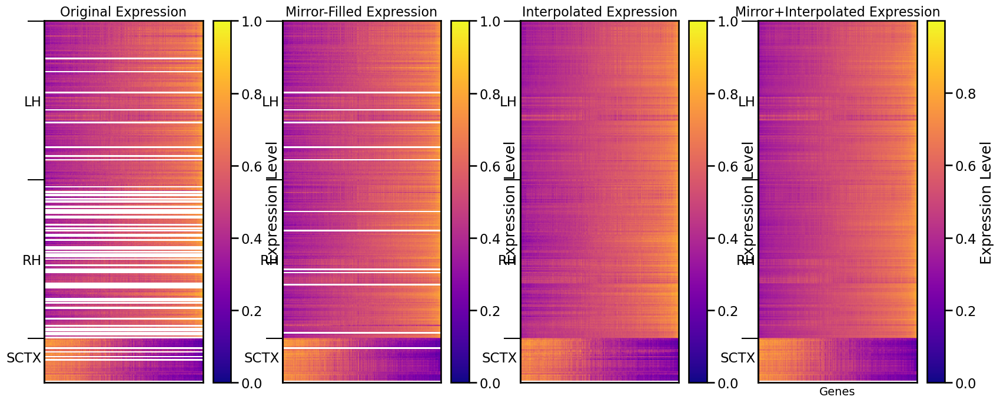

In [24]:

# Load different versions of transcriptome data for reference
X = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes='expression', impute_strategy=None)
X_mirror = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes='expression', impute_strategy='mirror')
X_interpolate = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes='expression', impute_strategy='interpolate')
X_mirror_interpolate = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes='expression', impute_strategy='mirror_interpolate')

# Use same sorting as raw data
'''
X_mirror = X_mirror[:, sort_idx]
X_interpolate = X_interpolate[:, sort_idx] 
X_mirror_interpolate = X_mirror_interpolate[:, sort_idx]
'''
# Visualize all versions
plt.figure(figsize=(20, 8))

plt.subplot(141)
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Original Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

plt.subplot(142)
plt.imshow(X_mirror, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Mirror-Filled Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

plt.subplot(143)
plt.imshow(X_interpolate, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Interpolated Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

plt.subplot(144)
plt.imshow(X_mirror_interpolate, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Mirror+Interpolated Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=14)


/scratch/asr655/neuroinformatics/GeneEx2Conn
/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/
Number of scans: 1959
Number of subjects with valid scans: 1817
Number of clean subjects: 1501


Text(0.5, 0, 'Genes')

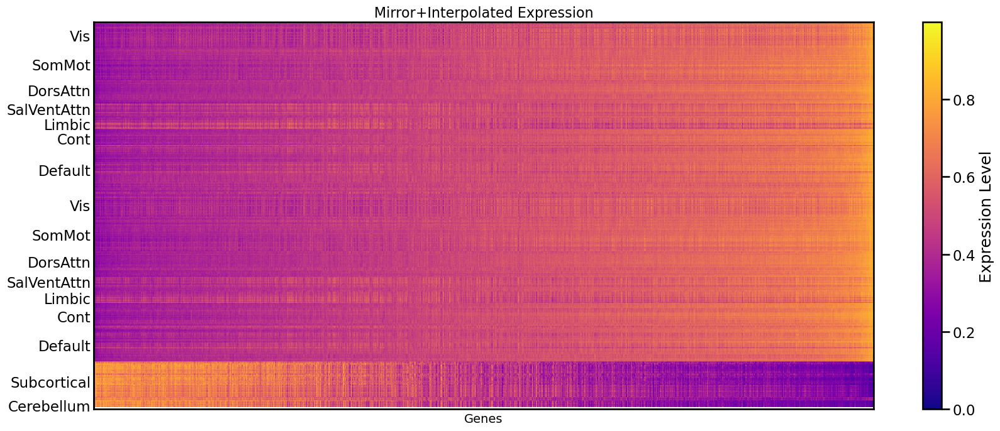

In [25]:
# Set paths
GeneEx2Conn_path = os.path.normpath(os.getcwd())
UKBB_path = os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/Penn_UKBB_data/'
print(GeneEx2Conn_path)
print(UKBB_path)

UKBB_demographics = pd.read_csv(UKBB_path + '/metadata/UKBB_MasterList_DemogInfo_part.csv')
unique_subject_ids = list(set([x.split('-')[1] for x in os.listdir(UKBB_path + '/XCP_D/') if x.startswith('sub-')]))
print(f"Number of scans: {len(unique_subject_ids)}")

with open(GeneEx2Conn_path + '/data/UKBB/UKBB_fMRI_subids.txt', 'r') as f:
    subjects_all = [line.strip() for line in f.readlines()]

with open(GeneEx2Conn_path + '/data/UKBB/UKBB_fMRI_subids_clean.txt', 'r') as f:
    subjects_clean = [line.strip() for line in f.readlines()]

print(f"Number of subjects with valid scans: {len(subjects_all)}")
print(f"Number of clean subjects: {len(subjects_clean)}")


schaef156_atlas_path = UKBB_path + '/atlases/atlas-4S156Parcels/atlas-4S156Parcels_dseg.tsv'
schaef156_atlas_info = pd.read_csv(schaef156_atlas_path, sep='\t')
schaef156_labels = schaef156_atlas_info['label'].tolist()

schaef456_atlas_path = UKBB_path + '/atlases/atlas-4S456Parcels/atlas-4S456Parcels_dseg.tsv'
schaef456_atlas_info = pd.read_csv(schaef456_atlas_path, sep='\t')
schaef456_labels = schaef456_atlas_info['label'].tolist()

schaef156_atlas_info.loc[schaef156_atlas_info['atlas_name'] == 'Cerebellum', 'network_label'] = 'Cerebellum'
schaef156_atlas_info.loc[(schaef156_atlas_info['network_label'].isna()) & 
                        (schaef156_atlas_info['atlas_name'] != 'Cerebellum'), 'network_label'] = 'Subcortical'

schaef456_atlas_info.loc[schaef456_atlas_info['atlas_name'] == 'Cerebellum', 'network_label'] = 'Cerebellum'
schaef456_atlas_info.loc[(schaef456_atlas_info['network_label'].isna()) & 
                        (schaef456_atlas_info['atlas_name'] != 'Cerebellum'), 'network_label'] = 'Subcortical'

schaef156_labels = schaef156_atlas_info['label'].tolist()
schaef156_network_labels = schaef156_atlas_info['network_label'].values
schaef456_labels = schaef456_atlas_info['label'].tolist()
schaef456_network_labels = schaef456_atlas_info['network_label'].values

# Get unique network labels and their positions
unique_networks = []
network_positions = []
prev_network = schaef456_network_labels[0]
start_pos = 0

for i, network in enumerate(schaef456_network_labels):
    if network != prev_network:
        unique_networks.append(prev_network)
        network_positions.append((start_pos + i - 1) / 2)
        start_pos = i
        prev_network = network

# Add final network
unique_networks.append(prev_network)
network_positions.append((start_pos + len(schaef456_network_labels) - 1) / 2)

plt.figure(figsize=(20, 8))

plt.imshow(X_mirror_interpolate, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Mirror+Interpolated Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add network labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks(network_positions, labels=unique_networks)
sec_ay.tick_params('y', length=0)

# Add x-axis label
plt.xlabel('Genes', fontsize=14)


[[ 1.          0.86911977  0.78124307 ... -0.78636192         nan
  -0.79073256]
 [ 0.86911977  1.          0.51899654 ... -0.70548875         nan
  -0.65198122]
 [ 0.78124307  0.51899654  1.         ... -0.63894085         nan
  -0.70955129]
 ...
 [-0.78636192 -0.70548875 -0.63894085 ...  1.                 nan
   0.93604681]
 [        nan         nan         nan ...         nan         nan
          nan]
 [-0.79073256 -0.65198122 -0.70955129 ...  0.93604681         nan
   1.        ]]


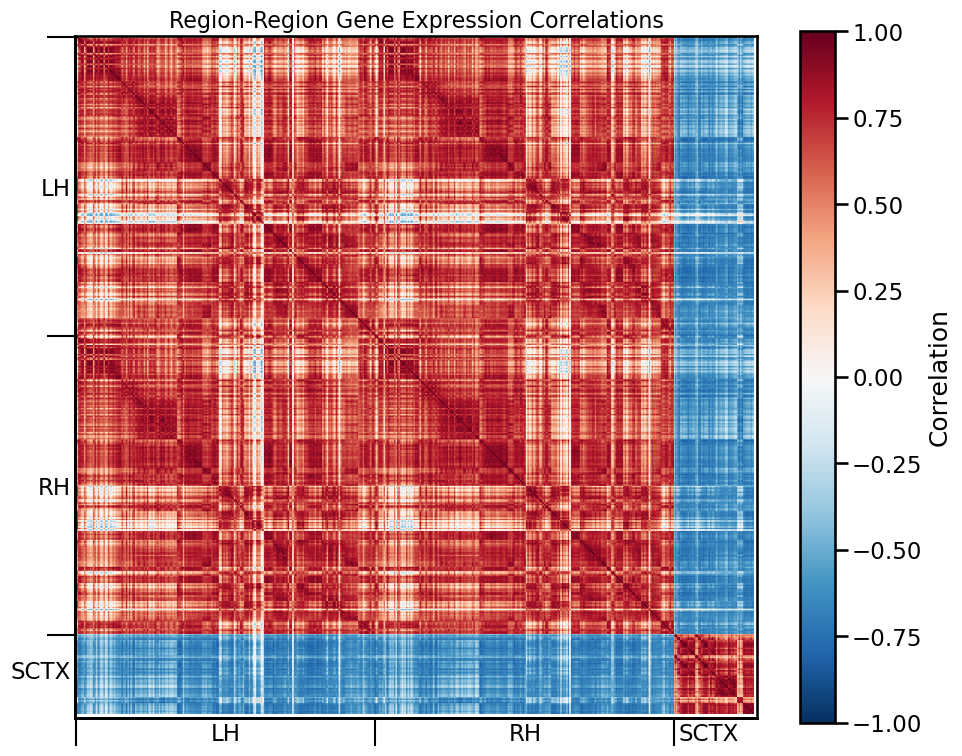

In [26]:
# Calculate correlation matrix of gene expression between regions
gene_expr_corr = np.corrcoef(X_mirror_interpolate)

# Create correlation matrix visualization
plt.figure(figsize=(10, 8))
im = plt.imshow(gene_expr_corr, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(label='Correlation')
plt.title('Region-Region Gene Expression Correlations', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add hemisphere labels and lines on both axes
sec_ax = plt.gca().secondary_xaxis(location=0)
sec_ax.set_xticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ax.tick_params('x', length=0)

# Add lines between regions - x-axis
sec_ax_lines = plt.gca().secondary_xaxis(location=0)
sec_ax_lines.set_xticks([0, 200, 400, 456], labels=[])
sec_ax_lines.tick_params('x', length=20, width=1.5)

# Add hemisphere labels and lines on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX']) 
sec_ay.tick_params('y', length=0)

# Add lines between regions - y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

plt.tight_layout()

# Print correlation matrix
print(gene_expr_corr)


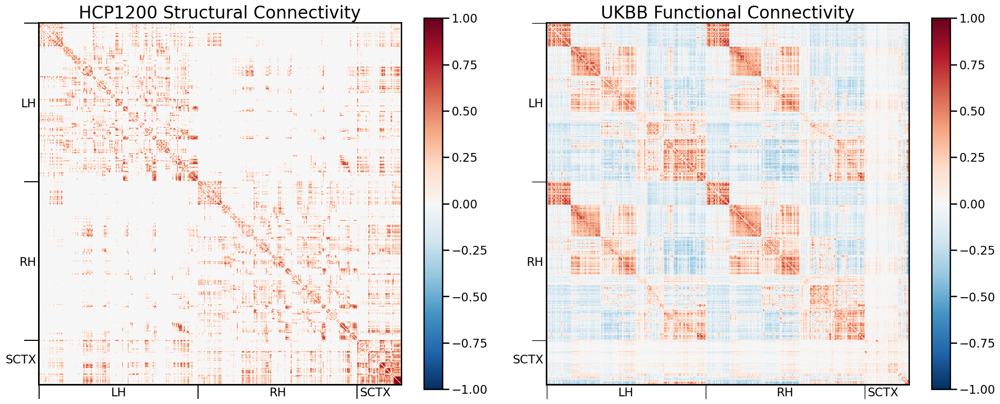

In [27]:
# Visualize structural and functional connectivity matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plot structural connectivity
im1 = ax1.imshow(Y_sc, cmap='RdBu_r', vmin=-1, vmax=1)
ax1.set_title('HCP1200 Structural Connectivity', fontsize=24)
plt.colorbar(im1, ax=ax1)

# Remove main ticks
ax1.set_xticks([])
ax1.set_yticks([])
# Secondary axis for region labels - structural
sec_ax1 = ax1.secondary_xaxis(location=0)
sec_ax1.set_xticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ax1.tick_params('x', length=0)

# Add lines between regions - structural x-axis
sec_ax1_lines = ax1.secondary_xaxis(location=0)
sec_ax1_lines.set_xticks([0, 200, 400, 456], labels=[])
sec_ax1_lines.tick_params('x', length=20, width=1.5)

# Secondary axis for region labels - structural y-axis
sec_ay1 = ax1.secondary_yaxis(location=0)
sec_ay1.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay1.tick_params('y', length=0)

# Add lines between regions - structural y-axis
sec_ay1_lines = ax1.secondary_yaxis(location=0)
sec_ay1_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay1_lines.tick_params('y', length=20, width=1.5)

# Plot functional connectivity
im2 = ax2.imshow(Y_fc, cmap='RdBu_r', vmin=-1, vmax=1)
ax2.set_title('UKBB Functional Connectivity', fontsize=24)
plt.colorbar(im2, ax=ax2)

# Remove main ticks
ax2.set_xticks([])
ax2.set_yticks([])

# Secondary axis for region labels - functional x-axis
sec_ax2 = ax2.secondary_xaxis(location=0)
sec_ax2.set_xticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ax2.tick_params('x', length=0)

# Add lines between regions - functional x-axis
sec_ax2_lines = ax2.secondary_xaxis(location=0)
sec_ax2_lines.set_xticks([0, 200, 400, 456], labels=[])
sec_ax2_lines.tick_params('x', length=20, width=1)

# Secondary axis for region labels - functional y-axis
sec_ay2 = ax2.secondary_yaxis(location=0)
sec_ay2.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay2.tick_params('y', length=0)

# Add lines between regions - functional y-axis
sec_ay2_lines = ax2.secondary_yaxis(location=0)
sec_ay2_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay2_lines.tick_params('y', length=20, width=1)

plt.tight_layout()
plt.show()


### S456 transcriptome and connectomes

#### Construct the features for the GLM 

All edges

In [28]:
Y_sc = load_connectome(parcellation='S400', omit_subcortical=False, hemisphere='both', measure='SC')
Y_fc, region_labels, lh_indices, rh_indices = load_connectome(parcellation='S400', omit_subcortical=False, hemisphere='both', measure='FC', include_labels=True)

UKBB_S456_atlas_info_path = os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/atlas_info/atlas-4S456Parcels_dseg_reformatted.csv'
UKBB_S456_atlas_info = pd.read_csv(UKBB_S456_atlas_info_path)
# Store labels and network labels from atlas info
region_labels = UKBB_S456_atlas_info['label'].tolist()
network_labels = UKBB_S456_atlas_info['network_label'].tolist()
# Store MNI coordinates from atlas info as list of [x,y,z] coordinates
mni_coords = [[x, y, z] for x, y, z in zip(UKBB_S456_atlas_info['mni_x'], 
                                          UKBB_S456_atlas_info['mni_y'],
                                          UKBB_S456_atlas_info['mni_z'])]

In [29]:

X = X_mirror_interpolate
Y_sc = Y_sc
Y_fc = Y_fc
network_labels = np.array(network_labels)
region_labels = np.array(region_labels)
mni_coords = np.array(mni_coords)
print("Before filtering:")
print("X shape:", X.shape)
print("Y_sc shape:", Y_sc.shape)
print("Y_fc shape:", Y_fc.shape)
print("Network labels shape:", network_labels.shape)
print("Region labels shape:", region_labels.shape)
print("MNI coordinates shape:", mni_coords.shape)
print()

Before filtering:
X shape: (456, 7380)
Y_sc shape: (456, 456)
Y_fc shape: (456, 456)
Network labels shape: (456,)
Region labels shape: (456,)
MNI coordinates shape: (456, 3)



In [30]:
# Create mask for non-NaN values
mask = ~np.isnan(X).any(axis=1) & ~np.isnan(Y_fc).any(axis=1)

# Apply mask to all arrays
X = X[mask]
Y_sc = Y_sc[mask][:, mask]
Y_fc = Y_fc[mask][:, mask]
network_labels = network_labels[mask]
region_labels = region_labels[mask]
mni_coords = mni_coords[mask]

print("After filtering:")
print("X shape:", X.shape)
print("Y_sc shape:", Y_sc.shape) 
print("Y_fc shape:", Y_fc.shape)
print("Network labels shape:", network_labels.shape)
print("Region labels shape:", region_labels.shape)
print("MNI coordinates shape:", mni_coords.shape)
print()


After filtering:
X shape: (455, 7380)
Y_sc shape: (455, 455)
Y_fc shape: (455, 455)
Network labels shape: (455,)
Region labels shape: (455,)
MNI coordinates shape: (455, 3)



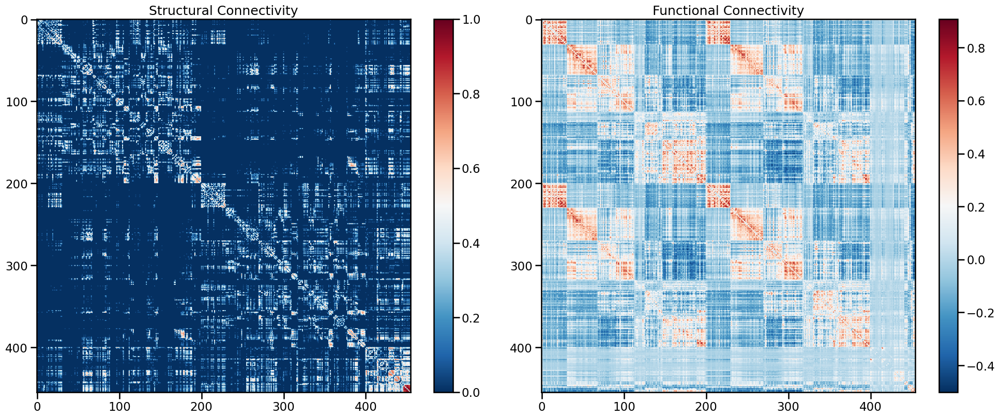

In [31]:
# Visualize structural and functional connectivity matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

im1 = ax1.imshow(Y_sc, cmap='RdBu_r')
ax1.set_title('Structural Connectivity')
plt.colorbar(im1, ax=ax1)

im2 = ax2.imshow(Y_fc, cmap='RdBu_r')
ax2.set_title('Functional Connectivity') 
plt.colorbar(im2, ax=ax2)

plt.tight_layout()
plt.show()


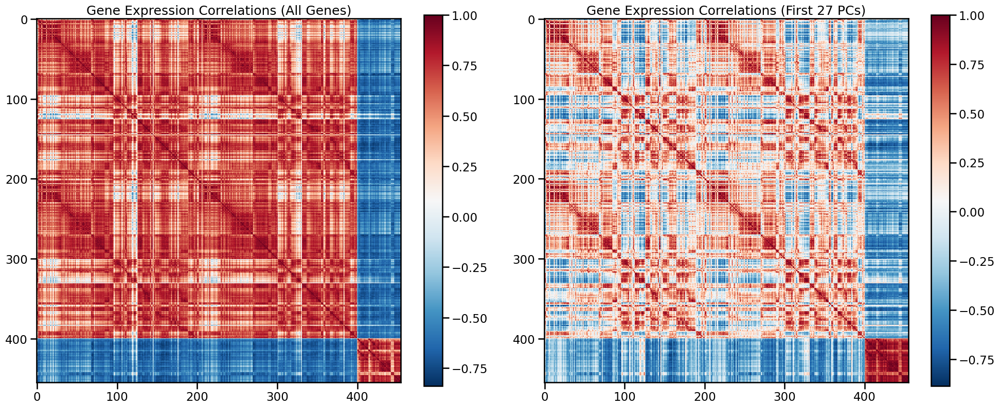

In [32]:
# Calculate gene expression correlations between regions
gene_corr = np.corrcoef(X)

# Calculate PCA of gene expression
pca = PCA()
X_pca = pca.fit_transform(X)

# Find number of components for 95% variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance >= 0.95) + 1
X_pca_95 = X_pca[:, :n_components]

# Calculate correlations using PCA-reduced gene expression
gene_corr_pca = np.corrcoef(X_pca_95)

# Visualize gene expression correlations with PCA
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

im1 = ax1.imshow(gene_corr, cmap='RdBu_r')
ax1.set_title('Gene Expression Correlations (All Genes)')
plt.colorbar(im1, ax=ax1)

im2 = ax2.imshow(gene_corr_pca, cmap='RdBu_r')
ax2.set_title(f'Gene Expression Correlations (First {n_components} PCs)')
plt.colorbar(im2, ax=ax2)

plt.tight_layout()
plt.show()


Quick test to evaluate necessary number of components for spectral embedding

  return np.asarray(x, float)

  offsets = np.asanyarray(offsets, float)



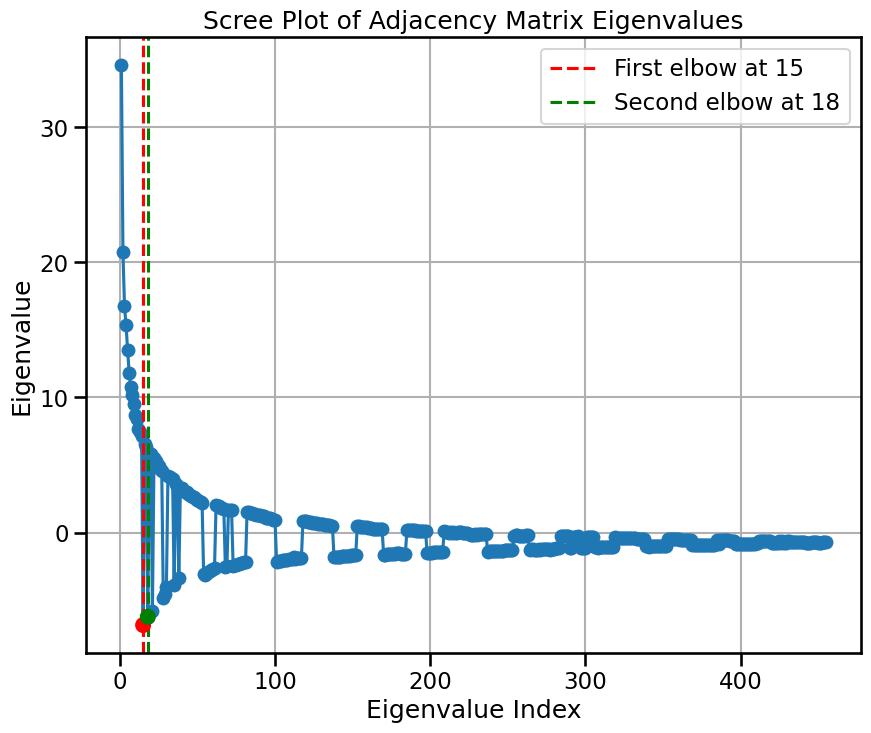

In [33]:
# Compute spectral embeddings using method 'A' on unmasked structural connectivity
adj_eigenvalues, adj_eigenvectors = eig(Y_sc)  # Use unmasked Y_sc

x_adj = range(1, len(adj_eigenvalues) + 1)
d1_adj = np.diff(adj_eigenvalues)
d2_adj = np.diff(d1_adj)
elbow_points_adj = np.argsort(np.abs(d2_adj))[-2:] + 2
first_elbow_adj = min(elbow_points_adj)
second_elbow_adj = max(elbow_points_adj)

# Plot eigenvalues for adjacency matrix embedding
plt.figure(figsize=(10, 8))
plt.plot(x_adj, adj_eigenvalues, marker='o')
plt.axvline(x=first_elbow_adj, color='r', linestyle='--', label=f'First elbow at {first_elbow_adj}')
plt.axvline(x=second_elbow_adj, color='g', linestyle='--', label=f'Second elbow at {second_elbow_adj}')
plt.scatter([first_elbow_adj, second_elbow_adj], 
           [adj_eigenvalues[first_elbow_adj-1], adj_eigenvalues[second_elbow_adj-1]], 
           color=['red', 'green'], s=100, zorder=5)
plt.xlabel('Eigenvalue Index')
plt.ylabel('Eigenvalue')
plt.title('Scree Plot of Adjacency Matrix Eigenvalues')
plt.legend()
plt.grid(True)
plt.show()

Dataset creation function

In [45]:
def construct_features_masked(X, Y_sc, Y_fc, mni_coords, mask_from, mask_to, spectrals):
    """
    Construct features for GLM modeling from input data matrices using masks to specify regions.
    
    Args:
        X: Full gene expression data matrix (AHBA_cortical_transcriptome)
        Y_sc: Full structural connectivity matrix
        Y_fc: Full functional connectivity matrix  
        mni_coords: MNI coordinates for all regions
        mask_from: Boolean mask for source regions (e.g. cortical_mask, left_hemi_mask)
        mask_to: Boolean mask for target regions (e.g. cortical_mask, right_hemi_mask)
        
    Returns:
        Dictionary containing feature arrays and embeddings for the masked subset
    """
    # Get masked coordinates and connectivity matrices
    mni_coords_from = mni_coords[mask_from]
    mni_coords_to = mni_coords[mask_to]
    
    # Get masked connectivity matrices
    Y_sc_masked = Y_sc[mask_from][:, mask_to]
    Y_fc_masked = Y_fc[mask_from][:, mask_to]

    # Compute spectral embeddings using method 'A' on unmasked structural connectivity
    _, eigenvectors = eig(Y_sc)  # Use unmasked Y_sc
    spectral_embeddings_from = eigenvectors[mask_from, :spectrals]  # Apply mask_from after computing eigenvectors
    spectral_embeddings_to = eigenvectors[mask_to, :spectrals]  # Apply mask_to after computing eigenvectors

    # Compute PCA from all gene expression data - determine components for 95% variance
    pca = PCA()
    X_pca_full = pca.fit_transform(X)  # Use unmasked X
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= 0.95) + 1
    # Get masked PCA components
    X_pca_masked_from = X_pca_full[mask_from]
    X_pca_masked_to = X_pca_full[mask_to]
    
    # Get masked gene expression
    X_masked_from = X[mask_from]
    X_masked_to = X[mask_to]

    # Calculate features between all pairs of masked regions
    num_from = len(mni_coords_from)
    num_to = len(mni_coords_to)
    
    distances = []
    sc_values = []
    fc_values = [] 
    gene_coexpression = []
    gene_PCA_coexpression = []
    spectral_similarity = []
    edge_PCA_embeddings = []
    edge_spectral_embeddings = []
    edge_mni_coords = []

    for i in range(num_from):
        for j in range(num_to):
            # Skip self-connections if masks overlap
            if mask_from is mask_to and i > j:
                continue
            if i != j:
                # Calculate euclidean distance between regions i and j
                dist = np.sqrt(np.sum((mni_coords_from[i] - mni_coords_to[j])**2))
                distances.append(dist)
                
                # Get connectivity values between regions i and j
                sc_values.append(Y_sc_masked[i, j])
                fc_values.append(Y_fc_masked[i, j])
                
                # Calculate gene expression similarity
                gene_coexp = np.corrcoef(X_masked_from[i], X_masked_to[j])[0,1]
                gene_coexpression.append(gene_coexp)
                
                # Calculate PCA-based gene expression similarity
                gene_pca_coexp = np.corrcoef(X_pca_masked_from[i], X_pca_masked_to[j])[0,1]
                gene_PCA_coexpression.append(gene_pca_coexp)
                
                # Calculate spectral embedding similarity
                spec_sim = np.corrcoef(spectral_embeddings_from[i], spectral_embeddings_to[j])[0,1]
                spectral_similarity.append(spec_sim)
                
                # Store embeddings
                edge_PCA_embeddings.append(np.concatenate([X_pca_masked_from[i], X_pca_masked_to[j]]))
                edge_spectral_embeddings.append(np.concatenate([spectral_embeddings_from[i], spectral_embeddings_to[j]]))
                edge_mni_coords.append(np.concatenate([mni_coords_from[i], mni_coords_to[j]]))

    # Convert lists to arrays
    features = {
        'distances': np.array(distances),
        'sc_values': np.array(sc_values),
        'fc_values': np.array(fc_values),
        'gene_coexpression': np.array(gene_coexpression),
        'gene_PCA_coexpression': np.array(gene_PCA_coexpression),
        'spectral_similarity': np.array(spectral_similarity),
        'edge_PCA_embeddings': np.array(edge_PCA_embeddings),
        'edge_spectral_embeddings': np.array(edge_spectral_embeddings),
        'edge_mni_coords': np.array(edge_mni_coords)
    }
    
    return features

In [46]:
# Call the function with our datasets
features = construct_features_masked(
    X,
    Y_sc, 
    Y_fc,
    mni_coords,
    mask_from=np.ones(X.shape[0], dtype=bool),
    mask_to=np.ones(X.shape[0], dtype=bool), 
    spectrals=13
)

print("Distances shape:", features['distances'].shape)
print("SC values shape:", features['sc_values'].shape)
print("FC values shape:", features['fc_values'].shape)
print("Gene coexpression shape:", features['gene_coexpression'].shape)
print("Gene PCA coexpression shape:", features['gene_PCA_coexpression'].shape)
print("Spectral similarity shape:", features['spectral_similarity'].shape)
print("Gene PCA shape:", features['edge_PCA_embeddings'].shape)
print("Spectral embeddings shape:", features['edge_spectral_embeddings'].shape)
print("MNI coordinates shape:", features['edge_mni_coords'].shape)

def fit_glm(features, feature_names, target_name='fc_values'):
    """
    Fit GLM model with specified features and calculate individual R^2 values
    
    Parameters:
    features (dict): Dictionary containing feature arrays
    feature_names (list): List of feature names to include in model
    target_name (str): Name of target feature to predict (default: 'fc_values')
    """
    # Get target variable
    target = features[target_name]
    
    # Prepare data for GLM
    X_glm = np.column_stack([features[name] for name in feature_names])
    X_glm = sm.add_constant(X_glm)  # Add constant
    
    print("Feature matrix shape:", X_glm.shape)
    
    # Fit full model
    model = sm.OLS(target, X_glm)
    results = model.fit()
    
    # Print full model summary
    print("\nFull model summary:")
    print(results.summary())
    
    # Calculate R^2 for individual features
    print("\nIndividual feature R^2 values:")
    r_squared_values = {}
    for name in feature_names:
        X_single = sm.add_constant(features[name])
        r_squared = sm.OLS(target, X_single).fit().rsquared
        r_squared_values[name] = r_squared
        print(f"R^2 for {name}: {r_squared:.3f}")
        
    return results, r_squared_values

# Run GLM with 1D features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

# Run GLM with all features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity', 'edge_PCA_embeddings', 'edge_spectral_embeddings', 'edge_mni_coords']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

Distances shape: (206570,)
SC values shape: (206570,)
FC values shape: (206570,)
Gene coexpression shape: (206570,)
Gene PCA coexpression shape: (206570,)
Spectral similarity shape: (206570,)
Gene PCA shape: (206570, 910)
Spectral embeddings shape: (206570, 26)
MNI coordinates shape: (206570, 6)
Feature matrix shape: (206570, 6)

Full model summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.126
Model:                            OLS   Adj. R-squared:                  0.126
Method:                 Least Squares   F-statistic:                     5948.
Date:                Thu, 20 Mar 2025   Prob (F-statistic):               0.00
Time:                        10:40:25   Log-Likelihood:                 71443.
No. Observations:              206570   AIC:                        -1.429e+05
Df Residuals:                  206564   BIC:                        -1.428e+05
Df Model:       

In [47]:
def analyze_feature_correlations(features, feature_names=None, labels=None):
    """
    Analyze correlations between features and check for NaN values.
    
    Parameters:
    features (dict): Dictionary containing feature arrays
    feature_names (list): List of feature names to analyze. If None, uses default list.
    labels (list): List of labels for plotting. If None, uses default list.
    """
    if feature_names is None:
        feature_names = ['distances', 'sc_values', 'fc_values', 'gene_coexpression', 
                        'gene_PCA_coexpression', 'spectral_similarity']
    if labels is None:
        labels = ['Distance', 'SC', 'FC', 'Gene Coexp', 'Gene PCA', 'Spectral']
        
    # Check for NaNs in each feature
    for name in feature_names:
        nan_mask = np.isnan(features[name])
        if np.any(nan_mask):
            print(f"NaNs detected in {name} at indices: {np.where(nan_mask)}")

    # Compute correlations between all pairs of features
    n = len(feature_names)
    correlations = np.zeros((n, n))

    for i in range(n):
        for j in range(n):
            correlations[i,j] = np.corrcoef(features[feature_names[i]], 
                                          features[feature_names[j]])[0,1]

    # Create heatmap
    plt.figure(figsize=(10,8))
    sns.heatmap(correlations,
                xticklabels=labels,
                yticklabels=labels, 
                annot=True,
                fmt='.3f',
                cmap='RdBu_r',
                center=0,
                vmin=-1,
                vmax=1,
                square=True)
    plt.title('Correlation heatmap')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Print individual correlations for reference
    print("\nDetailed correlations:")
    for i in range(n):
        for j in range(i+1,n):
            print(f"Correlation between {labels[i]} and {labels[j]}: {correlations[i,j]:.3f}")
            
    return correlations

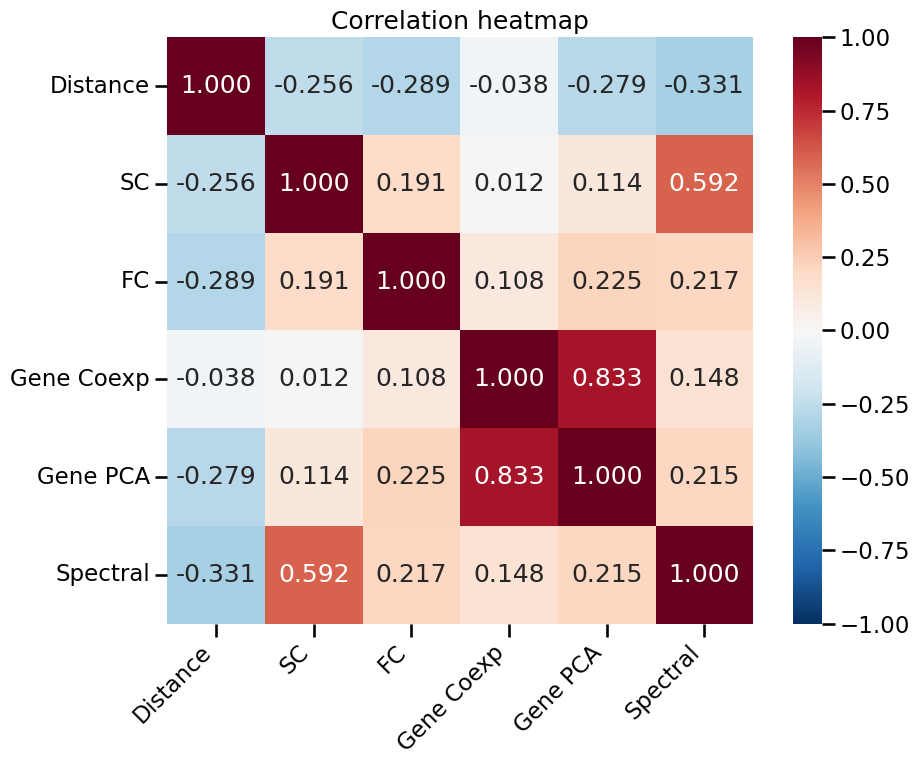


Detailed correlations:
Correlation between Distance and SC: -0.256
Correlation between Distance and FC: -0.289
Correlation between Distance and Gene Coexp: -0.038
Correlation between Distance and Gene PCA: -0.279
Correlation between Distance and Spectral: -0.331
Correlation between SC and FC: 0.191
Correlation between SC and Gene Coexp: 0.012
Correlation between SC and Gene PCA: 0.114
Correlation between SC and Spectral: 0.592
Correlation between FC and Gene Coexp: 0.108
Correlation between FC and Gene PCA: 0.225
Correlation between FC and Spectral: 0.217
Correlation between Gene Coexp and Gene PCA: 0.833
Correlation between Gene Coexp and Spectral: 0.148
Correlation between Gene PCA and Spectral: 0.215


array([[ 1.        , -0.25553612, -0.28908999, -0.038133  , -0.27899362,
        -0.33051513],
       [-0.25553612,  1.        ,  0.19147524,  0.01187714,  0.11438833,
         0.59182352],
       [-0.28908999,  0.19147524,  1.        ,  0.10783126,  0.2249194 ,
         0.21653108],
       [-0.038133  ,  0.01187714,  0.10783126,  1.        ,  0.83281129,
         0.14844207],
       [-0.27899362,  0.11438833,  0.2249194 ,  0.83281129,  1.        ,
         0.21539922],
       [-0.33051513,  0.59182352,  0.21653108,  0.14844207,  0.21539922,
         1.        ]])

In [48]:
# Call the function with default parameters
analyze_feature_correlations(features)

In [81]:
from scipy.optimize import curve_fit
from scipy.stats import binned_statistic

# Define exponential decay function from the paper
def exp_decay(x, SA_inf, SA_lambda):
    return SA_inf + (1 - SA_inf) * np.exp(-x / SA_lambda)

# Set bin size in mm (can be adjusted)
bin_size_mm = 10  # Change this value to adjust bin size

# Create bins based on specified size
bin_edges = np.arange(0, max(features['distances']) + bin_size_mm, bin_size_mm)
bin_means_fc, bin_edges, _ = binned_statistic(features['distances'], features['fc_values'], 
                                             statistic='mean', bins=bin_edges)
bin_std_fc, _, _ = binned_statistic(features['distances'], features['fc_values'], 
                                   statistic='std', bins=bin_edges)
bin_centers_fc = (bin_edges[:-1] + bin_edges[1:]) / 2

bin_means_sc, bin_edges, _ = binned_statistic(features['distances'], features['sc_values'], 
                                             statistic='mean', bins=bin_edges)
bin_std_sc, _, _ = binned_statistic(features['distances'], features['sc_values'], 
                                   statistic='std', bins=bin_edges)
bin_centers_sc = (bin_edges[:-1] + bin_edges[1:]) / 2

# Fit SA model for FC
popt_fc, _ = curve_fit(exp_decay, bin_centers_fc, bin_means_fc, 
                       p0=[0, 10], bounds=([-1, 0], [1, 100]), maxfev=5000)

# Fit SA model for SC
popt_sc, _ = curve_fit(exp_decay, bin_centers_sc, bin_means_sc, 
                       p0=[0, 10], bounds=([-1, 0], [1, 100]), maxfev=5000)

# Generate fit curve
x_fit = np.linspace(min(features['distances']), max(features['distances']), 100)
y_fit_fc = exp_decay(x_fit, *popt_fc)
y_fit_sc = exp_decay(x_fit, *popt_sc)


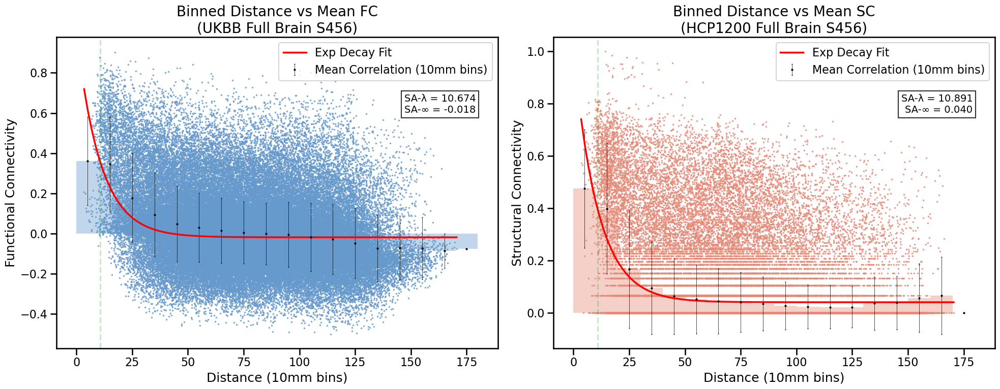

In [82]:
# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# --- PLOT FC vs Distance ---
# Add histogram-like bars first with high transparency
ax1.bar(bin_centers_fc, bin_means_fc, width=bin_size_mm, color='#6699cc', alpha=0.4)
# Plot scatter points
ax1.scatter(features['distances'], features['fc_values'], color='#6699cc', alpha=0.5, s=1)
# Plot mean points with error bars
ax1.errorbar(bin_centers_fc, bin_means_fc, yerr=bin_std_fc, color='black', fmt='o', 
             markersize=2, capsize=1, linewidth=0.5, label=f"Mean Correlation ({bin_size_mm}mm bins)")
ax1.plot(x_fit, y_fit_fc, "r-", linewidth=2.5, label="Exp Decay Fit")

# Add vertical line at lambda
ax1.axvline(x=popt_fc[1], color='green', linestyle='--', alpha=0.2)

# Add text box for SA parameters
sa_text = f'SA-λ = {popt_fc[1]:.3f}\nSA-∞ = {popt_fc[0]:.3f}'
ax1.text(0.95, 0.75, sa_text, transform=ax1.transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), 
         horizontalalignment='right', verticalalignment='bottom',
         fontsize=14)

ax1.set_xlabel(f'Distance ({bin_size_mm}mm bins)', fontsize=18)
ax1.set_ylabel('Functional Connectivity', fontsize=18)
ax1.set_title('Binned Distance vs Mean FC\n(UKBB Full Brain S456)', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=16)
ax1.legend(fontsize=16)

# --- PLOT SC vs Distance ---
# Add histogram-like bars first with high transparency
ax2.bar(bin_centers_sc, bin_means_sc, width=bin_size_mm, color='#e68a77', alpha=0.4)
# Plot scatter points
ax2.scatter(features['distances'], features['sc_values'], color='#e68a77', alpha=0.5, s=1)
# Plot mean points with error bars
ax2.errorbar(bin_centers_sc, bin_means_sc, yerr=bin_std_sc, color='black', fmt='o',
             markersize=2, capsize=1, linewidth=0.5, label=f"Mean Correlation ({bin_size_mm}mm bins)")
ax2.plot(x_fit, y_fit_sc, "r-", linewidth=2.5, label="Exp Decay Fit")

# Add vertical line at lambda
ax2.axvline(x=popt_sc[1], color='green', linestyle='--', alpha=0.2)

# Add text box for SA parameters
sa_text = f'SA-λ = {popt_sc[1]:.3f}\nSA-∞ = {popt_sc[0]:.3f}'
ax2.text(0.95, 0.75, sa_text, transform=ax2.transAxes, 
         bbox=dict(facecolor='white', alpha=0.8), 
         horizontalalignment='right', verticalalignment='bottom',
         fontsize=14)

ax2.set_xlabel(f'Distance ({bin_size_mm}mm bins)', fontsize=18)
ax2.set_ylabel('Structural Connectivity', fontsize=18)
ax2.set_title('Binned Distance vs Mean SC\n(HCP1200 Full Brain S456)', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=16)
ax2.legend(fontsize=16)

plt.tight_layout()
plt.show()


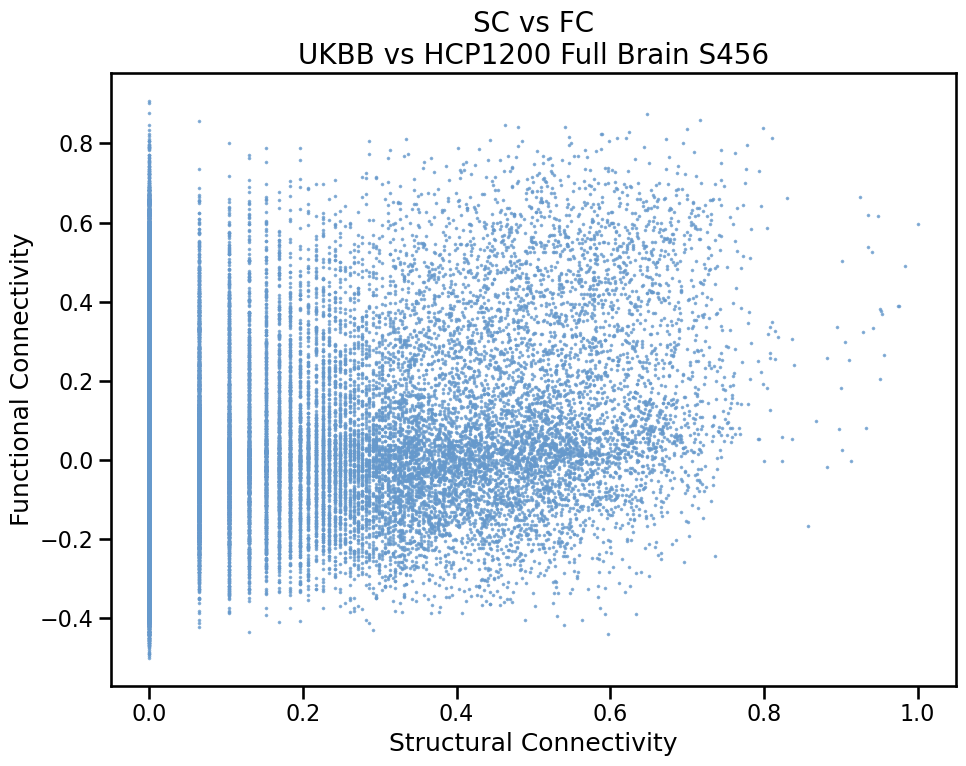

In [54]:

# --- PLOT SC vs FC ---
plt.figure(figsize=(10, 8))
plt.scatter(features['sc_values'], features['fc_values'], color='#6699cc', alpha=0.5, s=1)
plt.xlabel('Structural Connectivity', fontsize=18)
plt.ylabel('Functional Connectivity', fontsize=18)
plt.title('SC vs FC\nUKBB vs HCP1200 Full Brain S456', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.tight_layout()
plt.show()

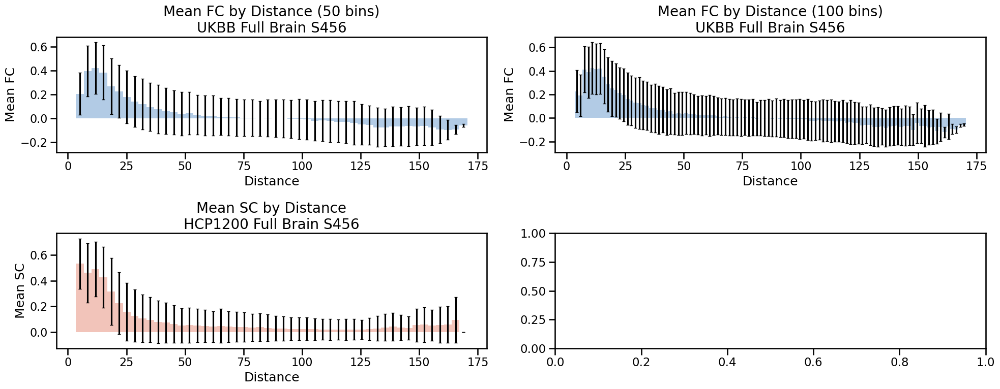

In [50]:
# Create figure with four subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 8))

# Plot mean FC binned by distance
dist_bins = np.linspace(min(features['distances']), max(features['distances']), 51)
dist_inds = np.digitize(features['distances'], dist_bins)
mean_fc = np.array([np.mean(features['fc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
std_fc = np.array([np.std(features['fc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2

ax1.bar(bin_centers, mean_fc, width=np.diff(dist_bins)[0], color='#6699cc', alpha=0.5, yerr=std_fc, capsize=2)
ax1.set_xlabel('Distance', fontsize=18)
ax1.set_ylabel('Mean FC', fontsize=18)
ax1.set_title('Mean FC by Distance (50 bins)\nUKBB Full Brain S456', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=16)

# Plot mean FC with more distance bins
dist_bins = np.linspace(min(features['distances']), max(features['distances']), 101)
dist_inds = np.digitize(features['distances'], dist_bins)
mean_fc = np.array([np.mean(features['fc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
std_fc = np.array([np.std(features['fc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2

ax2.bar(bin_centers, mean_fc, width=np.diff(dist_bins)[0], color='#6699cc', alpha=0.5, yerr=std_fc, capsize=2)
ax2.set_xlabel('Distance', fontsize=18)
ax2.set_ylabel('Mean FC', fontsize=18)
ax2.set_title('Mean FC by Distance (100 bins)\nUKBB Full Brain S456', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=16)

# Plot mean SC binned by distance
dist_bins = np.linspace(min(features['distances']), max(features['distances']), 51)
dist_inds = np.digitize(features['distances'], dist_bins)
mean_sc = np.array([np.mean(features['sc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
std_sc = np.array([np.std(features['sc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2

ax3.bar(bin_centers, mean_sc, width=np.diff(dist_bins)[0], color='#e68a77', alpha=0.5, yerr=std_sc, capsize=2)
ax3.set_xlabel('Distance', fontsize=18)
ax3.set_ylabel('Mean SC', fontsize=18)
ax3.set_title('Mean SC by Distance\nHCP1200 Full Brain S456', fontsize=20)
ax3.tick_params(axis='both', which='major', labelsize=16)


plt.tight_layout()
plt.show()

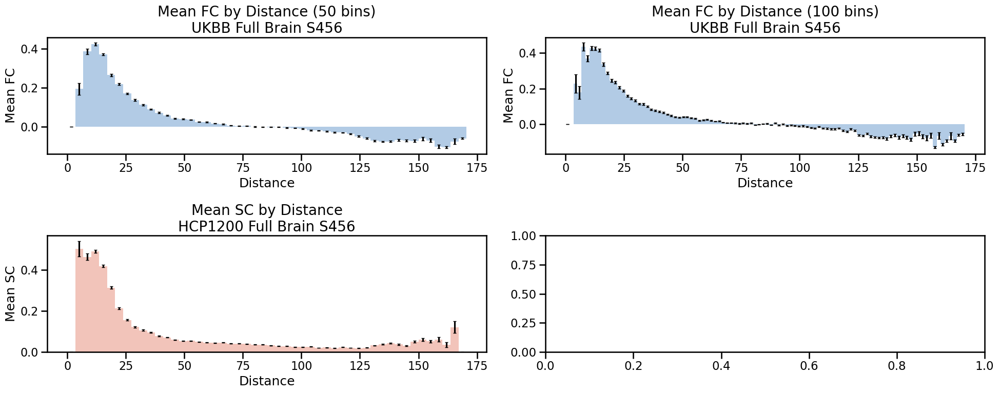

In [71]:
# Create figure with four subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 8))

# Plot mean FC binned by distance
dist_bins = np.linspace(min(features['distances']), max(features['distances']), 51)
dist_inds = np.digitize(features['distances'], dist_bins)
mean_fc = np.array([np.mean(features['fc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
sem_fc = np.array([np.std(features['fc_values'][dist_inds == i])/np.sqrt(np.sum(dist_inds == i)) for i in range(1, len(dist_bins))])
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2

ax1.bar(bin_centers, mean_fc, width=np.diff(dist_bins)[0], color='#6699cc', alpha=0.5, yerr=sem_fc, capsize=2)
ax1.set_xlabel('Distance', fontsize=18)
ax1.set_ylabel('Mean FC', fontsize=18)
ax1.set_title('Mean FC by Distance (50 bins)\nUKBB Full Brain S456', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=16)

# Plot mean FC with more distance bins
dist_bins = np.linspace(min(features['distances']), max(features['distances']), 101)
dist_inds = np.digitize(features['distances'], dist_bins)
mean_fc = np.array([np.mean(features['fc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
sem_fc = np.array([np.std(features['fc_values'][dist_inds == i])/np.sqrt(np.sum(dist_inds == i)) for i in range(1, len(dist_bins))])
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2

ax2.bar(bin_centers, mean_fc, width=np.diff(dist_bins)[0], color='#6699cc', alpha=0.5, yerr=sem_fc, capsize=2)
ax2.set_xlabel('Distance', fontsize=18)
ax2.set_ylabel('Mean FC', fontsize=18)
ax2.set_title('Mean FC by Distance (100 bins)\nUKBB Full Brain S456', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=16)

# Plot mean SC binned by distance
dist_bins = np.linspace(min(features['distances']), max(features['distances']), 51)
dist_inds = np.digitize(features['distances'], dist_bins)
mean_sc = np.array([np.mean(features['sc_values'][dist_inds == i]) for i in range(1, len(dist_bins))])
sem_sc = np.array([np.std(features['sc_values'][dist_inds == i])/np.sqrt(np.sum(dist_inds == i)) for i in range(1, len(dist_bins))])
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2

ax3.bar(bin_centers, mean_sc, width=np.diff(dist_bins)[0], color='#e68a77', alpha=0.5, yerr=sem_sc, capsize=2)
ax3.set_xlabel('Distance', fontsize=18)
ax3.set_ylabel('Mean SC', fontsize=18)
ax3.set_title('Mean SC by Distance\nHCP1200 Full Brain S456', fontsize=20)
ax3.tick_params(axis='both', which='major', labelsize=16)


plt.tight_layout()
plt.show()

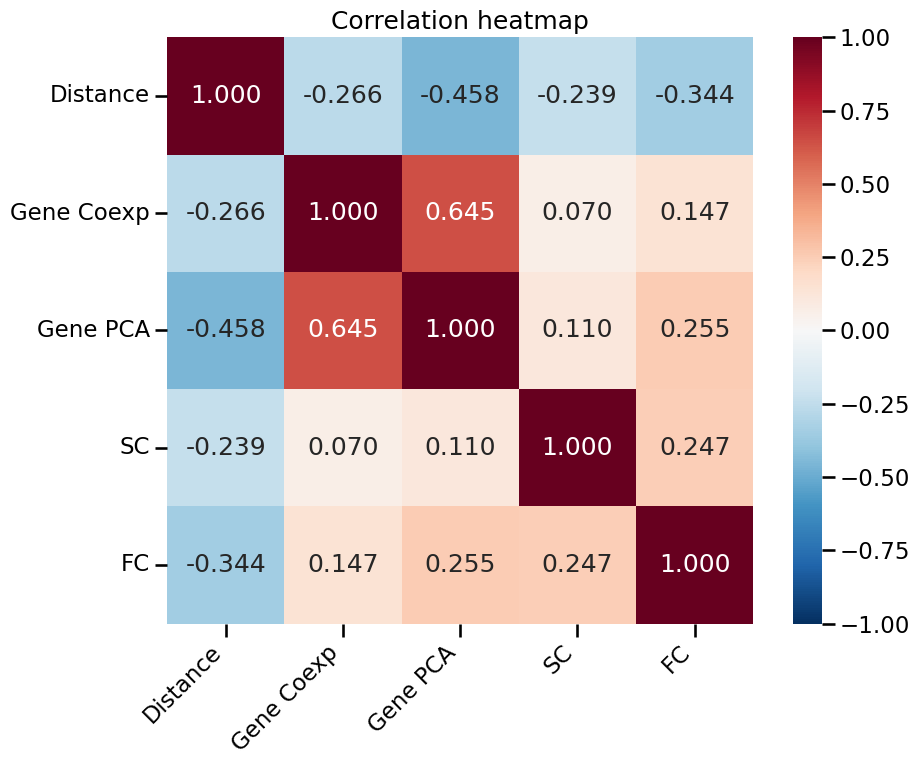


Detailed correlations:
Correlation between Distance and Gene Coexp: -0.266
Correlation between Distance and Gene PCA: -0.458
Correlation between Distance and SC: -0.239
Correlation between Distance and FC: -0.344
Correlation between Gene Coexp and Gene PCA: 0.645
Correlation between Gene Coexp and SC: 0.070
Correlation between Gene Coexp and FC: 0.147
Correlation between Gene PCA and SC: 0.110
Correlation between Gene PCA and FC: 0.255
Correlation between SC and FC: 0.247


array([[ 1.        , -0.26587731, -0.45830051, -0.23853711, -0.3442392 ],
       [-0.26587731,  1.        ,  0.64458323,  0.07030201,  0.14731359],
       [-0.45830051,  0.64458323,  1.        ,  0.11040392,  0.25537497],
       [-0.23853711,  0.07030201,  0.11040392,  1.        ,  0.24673915],
       [-0.3442392 ,  0.14731359,  0.25537497,  0.24673915,  1.        ]])

In [84]:
feature_names = ['distances', 'gene_coexpression', 'gene_PCA_coexpression', 'sc_values', 'fc_values',]
labels = ['Distance', 'Gene Coexp', 'Gene PCA', 'SC', 'FC',]

analyze_feature_correlations(features, feature_names, labels)

Right hemisphere only

In [152]:
features = construct_features_masked(
    X=AHBA_cortical_transcriptome,
    Y_sc=HCP1200_S456_structural_count_cortical, 
    Y_fc=UKBB_S456_functional_conn_cortical,
    mni_coords=cortical_mni_coords,
    mask_from=right_hemi_mask,
    mask_to=right_hemi_mask
)

print("Distances shape:", features['distances'].shape)
print("SC values shape:", features['sc_values'].shape)
print("FC values shape:", features['fc_values'].shape)
print("Gene coexpression shape:", features['gene_coexpression'].shape)
print("Gene PCA coexpression shape:", features['gene_PCA_coexpression'].shape)
print("Spectral similarity shape:", features['spectral_similarity'].shape)
print("Gene PCA shape:", features['edge_PCA_embeddings'].shape)
print("Spectral embeddings shape:", features['edge_spectral_embeddings'].shape)
print("MNI coordinates shape:", features['edge_mni_coords'].shape)


Distances shape: (10731,)
SC values shape: (10731,)
FC values shape: (10731,)
Gene coexpression shape: (10731,)
Gene PCA coexpression shape: (10731,)
Spectral similarity shape: (10731,)
Gene PCA shape: (10731, 678)
Spectral embeddings shape: (10731, 28)
MNI coordinates shape: (10731, 6)


In [153]:
# Run GLM with 1D features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

# Run GLM with all features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity', 'edge_PCA_embeddings', 'edge_spectral_embeddings', 'edge_mni_coords']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

Feature matrix shape: (10731, 6)

Full model summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.175
Model:                            OLS   Adj. R-squared:                  0.175
Method:                 Least Squares   F-statistic:                     456.3
Date:                Tue, 10 Dec 2024   Prob (F-statistic):               0.00
Time:                        15:28:42   Log-Likelihood:                 3072.4
No. Observations:               10731   AIC:                            -6133.
Df Residuals:                   10725   BIC:                            -6089.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

Interhemispheric connections only

In [154]:
features = construct_features_masked(
    X=AHBA_cortical_transcriptome,
    Y_sc=HCP1200_S456_structural_count_cortical, 
    Y_fc=UKBB_S456_functional_conn_cortical,
    mni_coords=cortical_mni_coords,
    mask_from=left_hemi_mask,
    mask_to=right_hemi_mask
)

print("Distances shape:", features['distances'].shape)
print("SC values shape:", features['sc_values'].shape)
print("FC values shape:", features['fc_values'].shape)
print("Gene coexpression shape:", features['gene_coexpression'].shape)
print("Gene PCA coexpression shape:", features['gene_PCA_coexpression'].shape)
print("Spectral similarity shape:", features['spectral_similarity'].shape)
print("Gene PCA shape:", features['edge_PCA_embeddings'].shape)
print("Spectral embeddings shape:", features['edge_spectral_embeddings'].shape)
print("MNI coordinates shape:", features['edge_mni_coords'].shape)


Distances shape: (28224,)
SC values shape: (28224,)
FC values shape: (28224,)
Gene coexpression shape: (28224,)
Gene PCA coexpression shape: (28224,)
Spectral similarity shape: (28224,)
Gene PCA shape: (28224, 678)
Spectral embeddings shape: (28224, 28)
MNI coordinates shape: (28224, 6)


In [155]:
# Run GLM with 1D features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

# Run GLM with all features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity', 'edge_PCA_embeddings', 'edge_spectral_embeddings', 'edge_mni_coords']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

Feature matrix shape: (28224, 6)

Full model summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.090
Model:                            OLS   Adj. R-squared:                  0.090
Method:                 Least Squares   F-statistic:                     561.3
Date:                Tue, 10 Dec 2024   Prob (F-statistic):               0.00
Time:                        15:28:50   Log-Likelihood:                 7890.9
No. Observations:               28224   AIC:                        -1.577e+04
Df Residuals:                   28218   BIC:                        -1.572e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

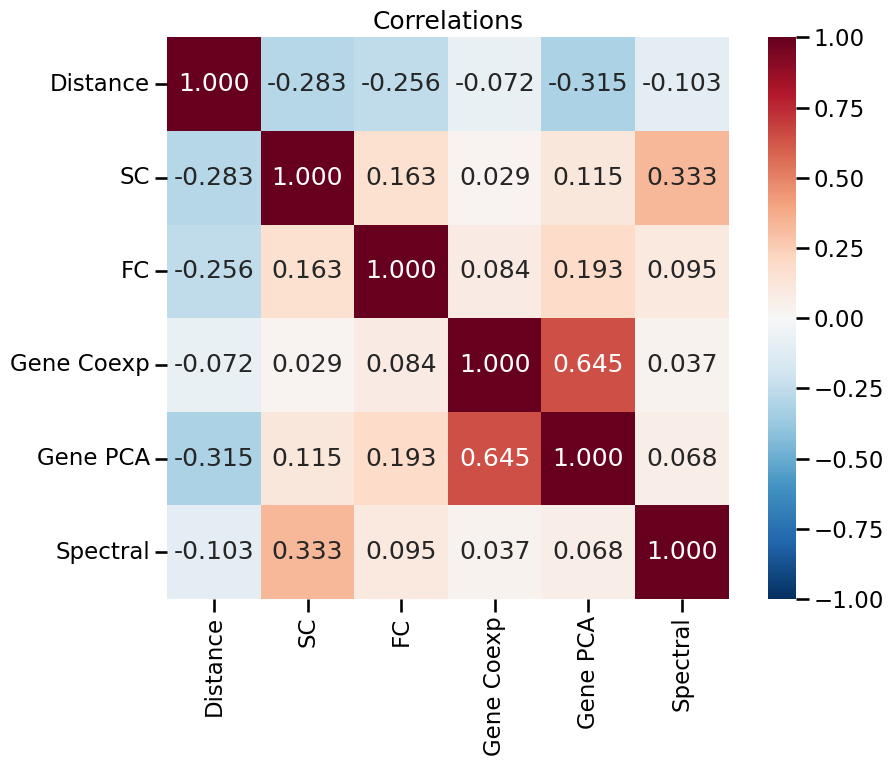


Detailed correlations:
Correlation between Distance and SC: -0.283
Correlation between Distance and FC: -0.256
Correlation between Distance and Gene Coexp: -0.072
Correlation between Distance and Gene PCA: -0.315
Correlation between Distance and Spectral: -0.103
Correlation between SC and FC: 0.163
Correlation between SC and Gene Coexp: 0.029
Correlation between SC and Gene PCA: 0.115
Correlation between SC and Spectral: 0.333
Correlation between FC and Gene Coexp: 0.084
Correlation between FC and Gene PCA: 0.193
Correlation between FC and Spectral: 0.095
Correlation between Gene Coexp and Gene PCA: 0.645
Correlation between Gene Coexp and Spectral: 0.037
Correlation between Gene PCA and Spectral: 0.068


array([[ 1.        , -0.28266103, -0.25598233, -0.0718463 , -0.31463783,
        -0.10282188],
       [-0.28266103,  1.        ,  0.16271542,  0.02933041,  0.11474613,
         0.332918  ],
       [-0.25598233,  0.16271542,  1.        ,  0.08390841,  0.19253781,
         0.09487894],
       [-0.0718463 ,  0.02933041,  0.08390841,  1.        ,  0.644547  ,
         0.03694787],
       [-0.31463783,  0.11474613,  0.19253781,  0.644547  ,  1.        ,
         0.06829012],
       [-0.10282188,  0.332918  ,  0.09487894,  0.03694787,  0.06829012,
         1.        ]])

In [108]:
# Call the function with default parameters
analyze_feature_correlations(features)